<div align="center">

# Livrable 2 — Débruitage d'Images par Auto-encodeur
## Projet DS Leyenda — TouNum

| | |
|:---|:---|
| **Étudiants**  | *BERRETTA BAPTISTE - HIVER ANDREW - KHALED REFKA - GORDIEN ALEXIS* |
| **Promotion**  | *FISA-INFO A5* |
| **École**      | CESI |
| **Date**       | Mai 2026 |

</div>

---

### Contexte métier

Les images numérisées par **TouNum** présentent des artefacts liés au matériel de scan :
bruit gaussien, artefacts JPEG, poussière, variations de luminosité.
Ces imperfections dégradent les traitements avals (captioning, OCR, classification).

Ce notebook implémente un **réseau encodeur-décodeur U-Net à apprentissage résiduel** (TensorFlow)
pour débruiter automatiquement les images du dossier `data_2/noises/`.

### Problématique centrale

> **Peut-on apprendre à débruiter des images sans jamais disposer d'images propres ?**

La réponse est **oui**, grâce à la stratégie **Noise-as-Target** (Lehtinen et al., Noise2Noise 2018) :
le réseau s'entraîne à retrouver une image bruitée à partir d'une version encore plus bruitée.
À l'inférence, le modèle extrapole et produit une version débruitée.

```
  x        : image bruitée disponible dans data_2/noises/
  x + ε    : x + bruit gaussien synthétique  →  entrée réseau
  x        : image originale bruitée         →  cible réseau

  Entraînement : minimiser ||f(x+ε) − x||
  Inférence    : f(x) ≈ x_propre
```

### Workflow général

```
Images bruitées  ──►  Exploration  ──►  Pipeline  ──►  U-Net  ──►  Évaluation  ──►  Interface
```


---
## Sommaire

| Section | Titre | Description |
|---------|-------|-------------|
| **0** | [Environnement de Travail](#0) | Installation, imports, configuration globale |
| **1** | [Exploration des Images Bruitées](#1) | Caractérisation du bruit, statistiques, FFT |
| **2a** | [Préparation des Données](#2a) | Chargement en mémoire, pipeline Noise-as-Target |
| **2b** | [Architecture U-Net](#2b) | Encodeur-décodeur avec skip connections, apprentissage résiduel |
| **2c** | [Entraînement](#2c) | Perte combinée MAE+SSIM, callbacks |
| **3** | [Résultats et Évaluation](#3) | PSNR, SSIM, comparaison visuelle, carte de différence |
| **3b** | [Comparaison — Architecture blur_unet (bbapt)](#3b) | Entraînement et comparaison avec l'architecture externe |
| **4** | [Débruitage des Images Réelles](#4) | Inférence directe sur data_2/noises/ |
| **5** | [Interface Interactive](#5) | GUI de débruitage à la demande |
| **6** | [Conclusion](#6) | Synthèse, limites, perspectives |

> **Comment utiliser ce notebook :**
> Exécuter les cellules dans l'ordre lors de la première exécution.
> Après un restart du kernel, utiliser la cellule de *Reprise rapide* (Section 2c) pour
> recharger le modèle sans ré-entraîner, puis exécuter directement les sections 3 à 5.


---
## 0. Environnement de Travail <a id="0"></a>

L'environnement d'exécution est un conteneur **Docker TensorFlow 2.14 avec GPU**.
Cette section configure :

- **Dépendances** : packages Python complémentaires (seaborn, ipywidgets, tqdm…)
- **Imports** : toutes les bibliothèques utilisées dans le notebook
- **Configuration** : chemins, hyperparamètres et constantes centralisés

> **Note sur scipy / scikit-image** : ces librairies ont été compilées pour NumPy 1.x
> et sont incompatibles avec NumPy 2.x présent dans cet environnement.
> Tous leurs usages sont remplacés par des équivalents `PIL`, `numpy` et `tf.image`.


In [1]:
# ============================================================
# INSTALLATION DES DÉPENDANCES
# Même liste que le livrable 1 — seuls ces packages sont absents
# de l'image Docker TF de base.
# ============================================================

from pip._internal.cli.main import main as _pip_install

for _pkg in ['seaborn', 'ipywidgets', 'pandas', 'tqdm']:
    try:
        __import__(_pkg)
        print(f"{_pkg} : déjà installé")
    except ImportError:
        print(f"{_pkg} : installation en cours...")
        _pip_install(['install', '--quiet', _pkg])
        print(f"{_pkg} : installé")

print("\nDépendances OK.")

seaborn : déjà installé
ipywidgets : déjà installé
pandas : déjà installé
tqdm : déjà installé

Dépendances OK.


In [2]:
# ============================================================
# IMPORTS
# scipy et scikit-image sont exclus : ils ont été compilés pour
# numpy 1.x et sont incompatibles avec numpy 2.x présent dans
# cet environnement. On utilise PIL + numpy + tf.image à la place.
# ============================================================
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from PIL import Image, ImageFile, ImageFilter

from tqdm.notebook import tqdm

tf.random.set_seed(42)
np.random.seed(42)
plt.rcParams['figure.dpi'] = 100
sns.set_theme(style='whitegrid')

# ---- Fonctions de remplacement (scipy / skimage) ----

def gaussian_blur_pil(img_array, radius=2):
    """Remplace scipy.ndimage.gaussian_filter — utilise PIL."""
    pil = Image.fromarray(img_array.astype(np.uint8))
    return np.array(pil.filter(ImageFilter.GaussianBlur(radius=radius)), dtype=np.float32)

def norm_pdf(x, mu, sigma):
    """Remplace scipy.stats.norm.pdf — calcul direct numpy."""
    return np.exp(-0.5 * ((x - mu) / sigma) ** 2) / (sigma * np.sqrt(2 * np.pi))

def compute_psnr(y_true, y_pred):
    """PSNR via tf.image.psnr (évite scikit-image)."""
    t = tf.constant(y_true[None], dtype=tf.float32)
    p = tf.constant(y_pred[None], dtype=tf.float32)
    return float(tf.image.psnr(t, p, max_val=1.0).numpy())

def compute_ssim(y_true, y_pred):
    """SSIM via tf.image.ssim (évite scikit-image)."""
    t = tf.constant(y_true[None], dtype=tf.float32)
    p = tf.constant(y_pred[None], dtype=tf.float32)
    return float(tf.image.ssim(t, p, max_val=1.0).numpy())

# ---- GPU ----
print(f"TensorFlow : {tf.__version__}")
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
    print(f"GPU disponible : {gpus[0].name}")
else:
    print("GPU non détecté — entraînement sur CPU")

2026-05-27 08:19:41.235217: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-27 08:19:41.339941: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-05-27 08:19:41.339995: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-05-27 08:19:41.340209: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-05-27 08:19:41.388263: I tensorflow/core/platform/cpu_feature_g

TensorFlow : 2.14.0
GPU disponible : /physical_device:GPU:0


2026-05-27 08:19:44.221328: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:19:44.248815: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:19:44.248858: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [3]:
# ============================================================
# CONFIGURATION GLOBALE
# ============================================================

_candidates = ['./data_2', '/tf/notebooks/data_2']
_data_base  = next((p for p in _candidates if os.path.isdir(p)), None)
if _data_base is None:
    raise FileNotFoundError(
        "Dossier 'data_2/' introuvable.\n"
        "Vérifiez que le volume Docker est bien monté avec :\n"
        "  -v \"<dossier_projet>:/tf/notebooks\""
    )

os.chdir(os.path.dirname(os.path.abspath(_data_base)))
print(f"Répertoire de travail : {os.getcwd()}")

NOISES_DIR      = './data_2/noises'
OUTPUT_DIR      = './data_2/noises/output'
MODEL_SAVE_PATH = './model_denoising.h5'

IMG_SIZE      = (256, 256)
BATCH_SIZE    = 8
EPOCHS        = 60
LEARNING_RATE = 1e-3
VAL_SPLIT     = 0.2

# NOISE_STD : amplitude du bruit gaussien synthétique ajouté pendant l'entraînement.
# σ = 0.04 (en fraction de [0,1]) ≈ 10/255 en valeur pixel.
# Calibré sur l'analyse FFT de la section 1 : correspond à l'amplitude du bruit réel.
# Trop grand (σ=0.08) → le modèle apprend à trop lisser → sur-lissage à l'inférence.
# Trop petit (σ=0.01) → le modèle n'apprend pas à corriger efficacement.
NOISE_STD = 0.04

image_files = sorted(
    glob.glob(os.path.join(NOISES_DIR, '*.jpg'))  +
    glob.glob(os.path.join(NOISES_DIR, '*.jpeg')) +
    glob.glob(os.path.join(NOISES_DIR, '*.png'))
)

print(f"Images bruitées  : {len(image_files)}")
print(f"Dossier sortie   : {OUTPUT_DIR}")
print(f"Taille réseau    : {IMG_SIZE[0]}x{IMG_SIZE[1]} px")
print(f"Batch size       : {BATCH_SIZE} | Epochs max : {EPOCHS}")
print(f"sigma bruit      : {NOISE_STD}  (réduit de 0.08 → 0.04)")

Répertoire de travail : /tf/notebooks
Images bruitées  : 148
Dossier sortie   : ./data_2/noises/output
Taille réseau    : 256x256 px
Batch size       : 8 | Epochs max : 60
sigma bruit      : 0.04  (réduit de 0.08 → 0.04)


---
## 1. Exploration des Images Bruitées <a id="1"></a>

Avant de construire le modèle, il est indispensable de **caractériser le bruit** présent dans les images.
Cette analyse répond à trois questions fondamentales :

| Question | Pourquoi c'est important |
|----------|--------------------------|
| **Quelle est la nature du bruit ?** | Détermine la stratégie d'entraînement (bruit gaussien synthétique adapté si le bruit est gaussien) |
| **Quelle est son amplitude (sigma) ?** | Calibre la valeur de `NOISE_STD` — trop fort = sur-lissage, trop faible = inefficace |
| **Y a-t-il des patterns spatiaux ?** | La FFT révèle des artefacts de compression JPEG ou des bandes périodiques |

### Types de bruit courants

| Type | Caractéristique | Signature FFT |
|------|----------------|---------------|
| **Gaussien additif** | Distribution normale, aléatoire spatialement | Spectre uniforme |
| **Sel & Poivre** | Pics aux valeurs 0 et 255 | Spectre uniforme + pics |
| **Artefacts JPEG** | Blocs 8×8 px de compression | Pics périodiques à 1/8 de la fréquence |
| **Bruit de quantification** | Paliers dans les zones uniformes | Harmoniques régulières |


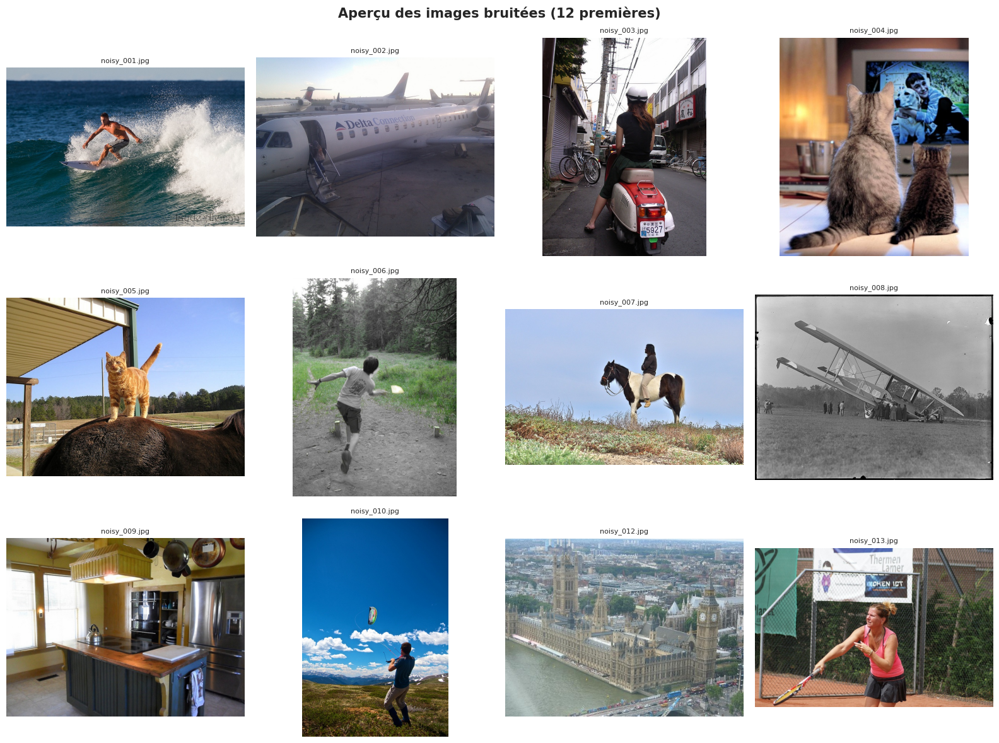

Total d'images dans le dossier : 148


In [4]:
# ============================================================
# AFFICHAGE D'UN ÉCHANTILLON D'IMAGES BRUITÉES
# ============================================================

n_show       = min(12, len(image_files))
sample_files = image_files[:n_show]

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle(f"Aperçu des images bruitées ({n_show} premières)",
             fontsize=15, fontweight='bold')

for idx, (ax, fpath) in enumerate(zip(axes.flatten(), sample_files)):
    img = Image.open(fpath).convert('RGB')
    ax.imshow(img)
    ax.set_title(os.path.basename(fpath), fontsize=8)
    ax.axis('off')

for ax in axes.flatten()[n_show:]:
    ax.axis('off')

plt.tight_layout()
plt.show()
print(f"Total d'images dans le dossier : {len(image_files)}")

Analyse:   0%|          | 0/148 [00:00<?, ?it/s]

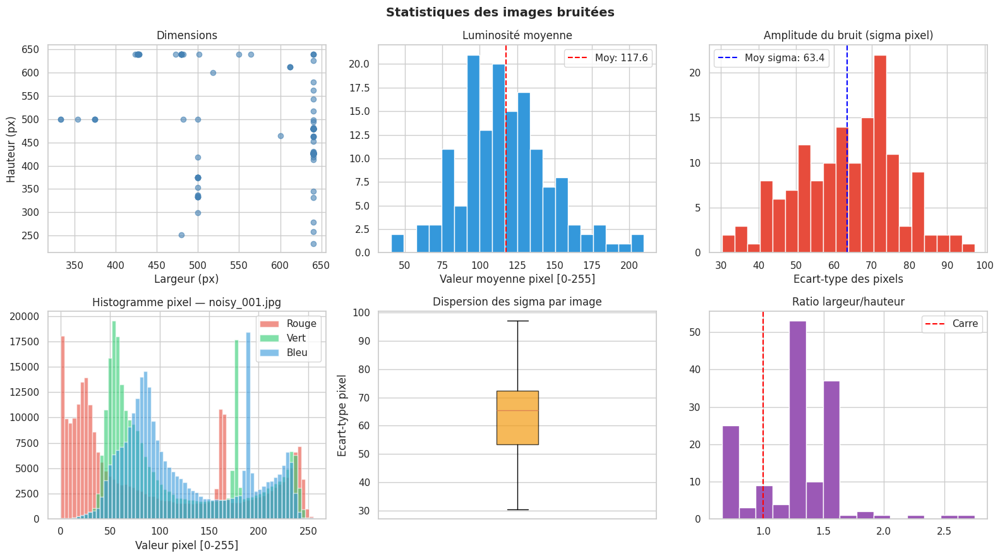


Statistiques globales :
       largeur  hauteur  moyenne    std
count    148.0    148.0    148.0  148.0
mean     583.9    478.8    117.6   63.4
std       86.2     95.2     30.2   13.6
min      333.0    233.0     40.9   30.3
25%      500.0    427.0     96.4   53.4
50%      640.0    480.0    114.0   65.4
75%      640.0    500.0    135.0   72.5
max      640.0    640.0    209.7   97.3


In [5]:
# ============================================================
# ANALYSE STATISTIQUE DES IMAGES
# Dimensions, luminosité moyenne, amplitude du bruit (écart-type)
# ============================================================

ImageFile.LOAD_TRUNCATED_IMAGES = True

records = []
for fpath in tqdm(image_files, desc='Analyse'):
    img = Image.open(fpath).convert('RGB')
    w, h = img.size
    arr  = np.array(img, dtype=np.float32)
    records.append({
        'fichier' : os.path.basename(fpath),
        'largeur' : w,
        'hauteur' : h,
        'ratio'   : round(w / h, 2),
        'moyenne' : round(float(arr.mean()), 1),
        'std'     : round(float(arr.std()), 1),
    })

df = pd.DataFrame(records)

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Statistiques des images bruitées', fontsize=14, fontweight='bold')

# Dimensions
axes[0,0].scatter(df['largeur'], df['hauteur'], alpha=0.6, c='steelblue')
axes[0,0].set_xlabel('Largeur (px)')
axes[0,0].set_ylabel('Hauteur (px)')
axes[0,0].set_title('Dimensions')

# Distribution des moyennes
axes[0,1].hist(df['moyenne'], bins=20, color='#3498db', edgecolor='white')
axes[0,1].axvline(df['moyenne'].mean(), color='red', ls='--',
                   label=f"Moy: {df['moyenne'].mean():.1f}")
axes[0,1].set_title('Luminosité moyenne')
axes[0,1].set_xlabel('Valeur moyenne pixel [0-255]')
axes[0,1].legend()

# Distribution des std
axes[0,2].hist(df['std'], bins=20, color='#e74c3c', edgecolor='white')
axes[0,2].axvline(df['std'].mean(), color='blue', ls='--',
                   label=f"Moy sigma: {df['std'].mean():.1f}")
axes[0,2].set_title('Amplitude du bruit (sigma pixel)')
axes[0,2].set_xlabel('Ecart-type des pixels')
axes[0,2].legend()

# Histogramme pixel d'une image
sample_arr = np.array(Image.open(image_files[0]).convert('RGB'), dtype=np.float32)
for c, (col, lbl) in enumerate([('#e74c3c','Rouge'), ('#2ecc71','Vert'), ('#3498db','Bleu')]):
    axes[1,0].hist(sample_arr[:,:,c].flatten(), bins=64, alpha=0.6, color=col, label=lbl)
axes[1,0].set_xlabel('Valeur pixel [0-255]')
axes[1,0].set_title(f"Histogramme pixel — {os.path.basename(image_files[0])}")
axes[1,0].legend()

# Boxplot std
axes[1,1].boxplot(df['std'], vert=True, patch_artist=True,
                   boxprops={'facecolor': '#f39c12', 'alpha': 0.7})
axes[1,1].set_title('Dispersion des sigma par image')
axes[1,1].set_ylabel('Ecart-type pixel')
axes[1,1].set_xticks([])

# Ratio
axes[1,2].hist(df['ratio'], bins=15, color='#9b59b6', edgecolor='white')
axes[1,2].axvline(1.0, color='red', ls='--', label='Carre')
axes[1,2].set_title('Ratio largeur/hauteur')
axes[1,2].legend()

plt.tight_layout()
plt.show()

print('\nStatistiques globales :')
print(df[['largeur','hauteur','moyenne','std']].describe().round(1).to_string())

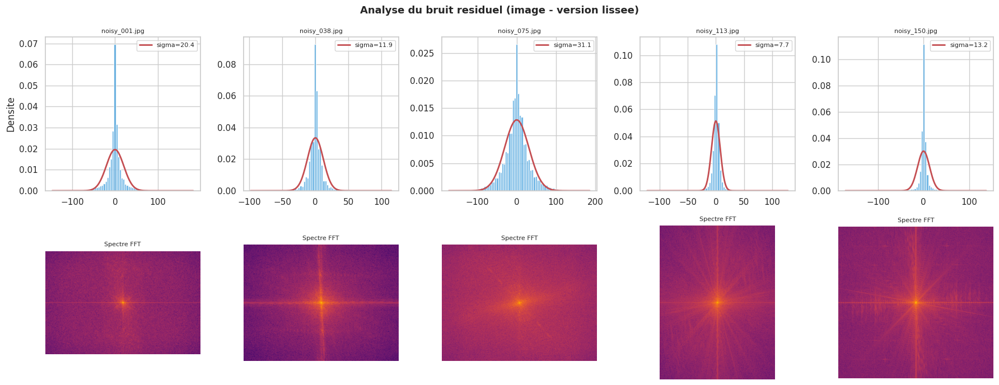


Kurtosis excess (1ere image) : 7.398  (0 = gaussien parfait)
  -> Bruit leptokurtique (queues plus lourdes qu'une gaussienne)

Strategie : le modele sera entraine avec un bruit gaussien additif synthetique.


In [6]:
# ============================================================
# ANALYSE DU TYPE DE BRUIT
#
# Methode : bruit residuel = image - version lissee (PIL GaussianBlur)
# Distribution gaussienne des residus  ->  bruit additif gaussien
# Pics aux extremes                    ->  sel & poivre
# Patterns structures en FFT           ->  artefacts JPEG
#
# Remplacement scipy : gaussian_filter -> PIL.ImageFilter.GaussianBlur
#                      norm.pdf        -> calcul numpy direct
#                      shapiro-wilk    -> kurtosis numpy
# ============================================================

def estimate_noise_residual(img_path, blur_radius=2):
    """Extrait le bruit = image - version lissee (sans scipy)."""
    img  = np.array(Image.open(img_path).convert('L'), dtype=np.float32)
    blur = gaussian_blur_pil(img, radius=blur_radius)
    return (img - blur).flatten()

sample_indices = np.linspace(0, len(image_files)-1, 5, dtype=int)
sample_paths   = [image_files[i] for i in sample_indices]

fig, axes = plt.subplots(2, len(sample_paths), figsize=(18, 7))
fig.suptitle('Analyse du bruit residuel (image - version lissee)',
             fontsize=13, fontweight='bold')

for j, fpath in enumerate(sample_paths):
    residuals = estimate_noise_residual(fpath)
    mu, sigma = residuals.mean(), residuals.std()
    x = np.linspace(residuals.min(), residuals.max(), 200)

    axes[0, j].hist(residuals, bins=80, density=True, color='#3498db', alpha=0.75)
    axes[0, j].plot(x, norm_pdf(x, mu, sigma), 'r-', lw=2, label=f'sigma={sigma:.1f}')
    axes[0, j].set_title(os.path.basename(fpath), fontsize=8)
    axes[0, j].legend(fontsize=8)
    if j == 0:
        axes[0, j].set_ylabel('Densite')

    img_gray = np.array(Image.open(fpath).convert('L'), dtype=np.float32)
    # FFT 2D : transformée de Fourier de l'image en niveaux de gris.
    # fftshift : centre les basses fréquences au milieu du spectre.
    # log1p : compresse la dynamique pour visualiser les harmoniques faibles.
    # Un spectre uniforme → bruit gaussien aléatoire.
    # Des pics réguliers → artefacts JPEG (bandes à 1/8 de la fréquence).
    fft_mag  = np.abs(np.fft.fftshift(np.fft.fft2(img_gray)))
    axes[1, j].imshow(np.log1p(fft_mag), cmap='inferno')
    axes[1, j].axis('off')
    axes[1, j].set_title('Spectre FFT', fontsize=8)

plt.tight_layout()
plt.show()

# Test de normalite via kurtosis (remplace Shapiro-Wilk de scipy)
# Kurtosis excess ~ 0 -> distribution proche d'une gaussienne
residuals_all = estimate_noise_residual(image_files[0])
kurt = float(((residuals_all - residuals_all.mean())**4).mean() / residuals_all.std()**4 - 3)
print(f"\nKurtosis excess (1ere image) : {kurt:.3f}  (0 = gaussien parfait)")
if abs(kurt) < 1.0:
    print("  -> Bruit proche d'une distribution gaussienne")
elif kurt > 1.0:
    print("  -> Bruit leptokurtique (queues plus lourdes qu'une gaussienne)")
else:
    print("  -> Bruit platykurtique (queues plus legeres qu'une gaussienne)")
print("\nStrategie : le modele sera entraine avec un bruit gaussien additif synthetique.")

---
## 2. Modèle de Débruitage — Auto-encodeur U-Net

### 2a. Préparation des Données <a id="2a"></a>

#### Pourquoi un auto-encodeur plutôt qu'un filtre classique ?

Les filtres classiques (Gaussien, médiane, bilatéral) appliquent une règle fixe à toutes les images.
Un **auto-encodeur** apprend la règle optimale pour **ce dataset spécifique** — il s'adapte
aux caractéristiques du bruit et des images de TouNum.

| Approche | Avantages | Inconvénients |
|----------|-----------|---------------|
| Filtre gaussien | Simple, rapide, aucune donnée | Floute les détails utiles |
| Filtre bilatéral | Préserve les bords | Paramètres à régler manuellement |
| **Auto-encodeur U-Net** | S'adapte au bruit, préserve la structure | Nécessite des données + entraînement |

#### Stratégie d'entraînement auto-supervisé (Noise-as-Target)

Sans images propres de référence, on génère des **paires synthétiques** à la volée :

```
  x          : image bruitée réelle (disponible dans data_2/noises/)
  x + ε      : x + bruit gaussien synthétique (NOISE_STD = 0.04)  →  entrée réseau
  x          : image bruitée originale                             →  cible réseau

  Apprentissage : le réseau apprend à "désapprendre" le bruit ε ajouté
  Inférence     : f(x) ≈ version sans artefacts de x
```

#### Pourquoi charger toutes les images en RAM ?

Avec seulement ~148 images × 256×256×3 float32 ≈ **150 Mo** (acceptable),
le chargement complet en RAM évite les I/O disque à chaque epoch et accélère l'entraînement.
Pour un dataset plus grand (> 10 000 images), on utiliserait `tf.data` avec lecture à la demande.

#### Pipeline tf.data

```
  Train : image → flip H/V aléatoire → brightness aléatoire → +bruit ε  →  (entrée, cible)
  Val   : image → +bruit ε                                               →  (entrée, cible)
```

L'augmentation spatiale (flip) n'est appliquée qu'au train pour maximiser la variété sans
introduire de biais dans l'évaluation.


In [7]:
# ============================================================
# CHARGEMENT DE TOUTES LES IMAGES EN MÉMOIRE
#
# Stratégie : chargement complet en numpy plutôt que streaming tf.data.
# Justification : ~148 images × 256×256×3 float32 ≈ 150 Mo — tenable en RAM.
# Avantage   : zéro I/O disque pendant l'entraînement → epochs plus rapides.
# Limite     : > 10 000 images → préférer tf.data avec cache() ou lecture à la demande.
# ============================================================

ImageFile.LOAD_TRUNCATED_IMAGES = True

all_images = []
for fpath in tqdm(image_files, desc='Chargement'):
    try:
        img = Image.open(fpath).convert('RGB').resize(IMG_SIZE, Image.LANCZOS)
        all_images.append(np.array(img, dtype=np.float32) / 255.0)
    except Exception as e:
        print(f"  Ignore ({os.path.basename(fpath)}) : {e}")

all_images = np.array(all_images)   # (N, H, W, 3)
print(f"\nDataset : {all_images.shape}")
print(f"Plage   : [{all_images.min():.3f}, {all_images.max():.3f}]")
print(f"RAM     : ~{all_images.nbytes / 1e6:.1f} Mo")

# Melange aleatoire avant split pour eviter le biais d'ordre
np.random.shuffle(all_images)
n_val        = max(1, int(len(all_images) * VAL_SPLIT))
train_images = all_images[:-n_val]
val_images   = all_images[-n_val:]

print(f"\nSplit — Train : {len(train_images)} | Val : {len(val_images)}")

Chargement:   0%|          | 0/148 [00:00<?, ?it/s]


Dataset : (148, 256, 256, 3)
Plage   : [0.000, 1.000]
RAM     : ~116.4 Mo

Split — Train : 119 | Val : 29


In [8]:
# ============================================================
# PIPELINE tf.data — Génération des paires Noise-as-Target
#
# Principe : à chaque epoch, chaque image génère une paire différente :
#   - entrée  : image + bruit gaussien aléatoire (σ=NOISE_STD)
#   - cible   : image originale (sans le bruit ajouté)
#
# Le réseau apprend à "défaire" le bruit ε, ce qui le conduit
# implicitement à apprendre à débruiter des images réelles.
#
# train_pair : augmentation spatiale + bruit  (diversité maximale)
# val_pair   : bruit seul, pas d'augmentation (évaluation cohérente)
# ============================================================

AUTOTUNE = tf.data.AUTOTUNE

def add_gaussian_noise(image, std=NOISE_STD):
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=std)
    return tf.clip_by_value(image + noise, 0.0, 1.0)

def train_pair(image):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.clip_by_value(
        tf.image.random_brightness(image, max_delta=0.05), 0.0, 1.0
    )
    return add_gaussian_noise(image), image

def val_pair(image):
    return add_gaussian_noise(image), image

train_ds = (
    tf.data.Dataset.from_tensor_slices(train_images)
    .shuffle(len(train_images), seed=42)
    .map(train_pair, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

val_ds = (
    tf.data.Dataset.from_tensor_slices(val_images)
    .map(val_pair, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

print("Pipeline configure.")
print(f"  train_ds : {tf.data.experimental.cardinality(train_ds)} batches")
print(f"  val_ds   : {tf.data.experimental.cardinality(val_ds)} batches")

2026-05-27 08:22:24.239862: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:22:24.240007: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:22:24.240023: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:22:25.264901: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2026-05-27 08:22:25.265043: I tensorflow/compile

Pipeline configure.
  train_ds : 15 batches
  val_ds   : 4 batches


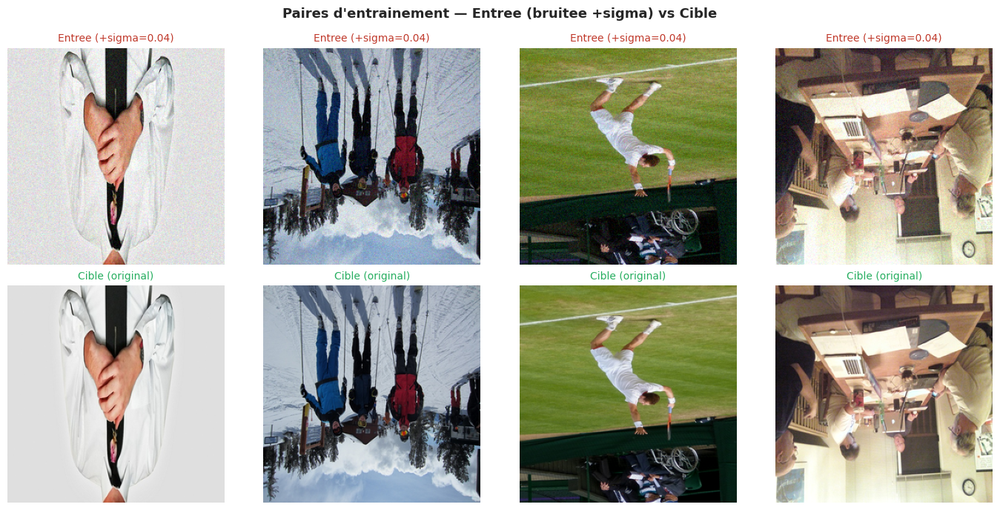

In [9]:
# ============================================================
# VISUALISATION DES PAIRES D'ENTRAINEMENT
# Montre ce que le reseau recoit en entree vs ce qu'il doit produire
# ============================================================

for batch_noisy, batch_clean in train_ds.take(1):
    pass

n_show = 4
fig, axes = plt.subplots(2, n_show, figsize=(14, 7))
fig.suptitle("Paires d'entrainement — Entree (bruitee +sigma) vs Cible",
             fontsize=13, fontweight='bold')

for j in range(n_show):
    axes[0, j].imshow(np.clip(batch_noisy[j].numpy(), 0, 1))
    axes[0, j].axis('off')
    axes[0, j].set_title(f"Entree (+sigma={NOISE_STD})", fontsize=10, color='#c0392b')

    axes[1, j].imshow(np.clip(batch_clean[j].numpy(), 0, 1))
    axes[1, j].axis('off')
    axes[1, j].set_title("Cible (original)", fontsize=10, color='#27ae60')

plt.tight_layout()
plt.show()

---
### 2b. Architecture — U-Net à Apprentissage Résiduel <a id="2b"></a>

#### Qu'est-ce qu'un auto-encodeur ?

Un **auto-encodeur** est un réseau de neurones en deux parties :
- L'**encodeur** compresse progressivement l'image en une représentation compacte (le *code latent*)
- Le **décodeur** reconstruit l'image à partir de ce code comprimé

Le **goulot d'étranglement** (bottleneck) force le réseau à ne retenir que l'information essentielle
et à ignorer le bruit haute fréquence, qui ne peut pas être encodé dans un espace de dimension réduite.

```
  Encodeur           Bottleneck          Décodeur
  256x256x3  →  ...  →  32x32x256  →  ...  →  256x256x3
  (original)                              (reconstruction)
```

#### Pourquoi U-Net et pas un simple auto-encodeur ?

Un auto-encodeur classique perd les détails fins dans le bottleneck (textures, bords nets).
Le **U-Net** (Ronneberger et al., 2015 — initialement conçu pour la segmentation médicale)
résout ce problème avec des **connexions de saut (skip connections)** :
chaque couche de l'encodeur est connectée directement à la couche symétrique du décodeur.

```
  ENC 1  ────────────────────────────────────────────►  DEC 1   (skip : détails fins)
  ENC 2  ─────────────────────────────────►  DEC 2              (skip : textures)
  ENC 3  ────────────────────►  DEC 3                           (skip : formes)
            BOTTLENECK                                           (sémantique globale)
```

Ces skip connections permettent au décodeur de récupérer les informations perdues par le bottleneck,
produisant une image reconstruite **nette et détaillée** plutôt que floue.

#### Pourquoi l'apprentissage résiduel ?

Un réseau qui tente de prédire directement l'image propre risque de converger vers
la **solution de facilité** : retourner une moyenne floue de toutes les images possibles,
ce qui minimise le MSE mais produit des images peu nettes.

L'**apprentissage résiduel** force le réseau à prédire uniquement le **bruit à soustraire**,
ce qui correspond à des corrections minimales :

```
  Approche directe   : f(x) = x_propre              ← le réseau doit "imaginer" l'image propre
  Approche résiduelle: f(x) = x - réseau(x)         ← le réseau corrige seulement les artefacts
```

Le biais naturel du réseau (poids initialisés à ~0) est de ne rien corriger,
ce qui est une bonne initialisation pour du débruitage.

#### Architecture complète

```
 INPUT (256×256×3)
   │
   ├─► ENC 1 ── Conv(32)×2 → BN → ReLU ─────────────────────────────────┐ skip_1
   │            256×256×32  →  MaxPool  →  128×128×32                    │
   ├─► ENC 2 ── Conv(64)×2 → BN → ReLU ──────────────────────┐ skip_2   │
   │            128×128×64  →  MaxPool  →   64×64×64          │          │
   ├─► ENC 3 ── Conv(128)×2 → BN → ReLU ──────────┐ skip_3   │          │
   │             64×64×128  →  MaxPool  →  32×32×128│          │          │
   ├─► BOTTLENECK ── Conv(256)×2 → BN → ReLU        │          │          │
   │                 32×32×256                        │          │          │
   ├─► DEC 3 ── UpSampling2D → Concat(skip_3) → Conv(128)×2 ──┘          │
   ├─► DEC 2 ── UpSampling2D → Concat(skip_2) → Conv(64)×2  ─────────────┘ (skip via Concatenate)
   ├─► DEC 1 ── UpSampling2D → Concat(skip_1) → Conv(32)×2  ─────────────┘
   │            256×256×32
   │
   ├─► Conv2D(3, 1×1, tanh) →  résidu de bruit  [−1, 1]
   │
   OUTPUT = clip(INPUT − résidu, 0, 1)   →  256×256×3
```

#### Justification des composants

| Composant | Rôle |
|-----------|------|
| **Conv2D(3×3) × 2** | Double convolution : champ récepteur plus large, features plus riches |
| **BatchNormalization** | Stabilise et accélère l'entraînement, régularise implicitement |
| **MaxPooling2D** | Réduit la résolution (compression), élargit le champ récepteur |
| **UpSampling2D** | Restaure la résolution sans paramètres apprenants (≠ Conv2DTranspose) |
| **Concatenate** | Skip connection — fusionne features de l'encodeur et du décodeur |
| **tanh (sortie)** | Résidu borné [−1, 1], centré en 0 — correction symétrique |
| **Subtract + clip** | Soustrait le bruit prédit, garantit une sortie dans [0, 1] |


In [10]:
# ============================================================
# CONSTRUCTION DU U-NET RÉSIDUEL
# Le réseau prédit le bruit à soustraire (pas l'image propre).
# Cela empêche la convergence vers une solution floue.
# ============================================================

def conv_block(x, filters, dropout_rate=0.1):
    """Double convolution : Conv -> BN -> ReLU -> Conv -> BN -> ReLU (-> Dropout)."""
    x = layers.Conv2D(filters, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(filters, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    return x


def build_unet(input_shape=(256, 256, 3)):
    """
    U-Net résiduel pour le débruitage.
    Le réseau prédit le résidu de bruit (sortie tanh) et le soustrait
    à l'image d'entrée. Empêche le sur-lissage dû à l'apprentissage direct.
    """
    inputs = layers.Input(shape=input_shape, name='image_bruitee')

    # ---- Encodeur ----
    c1 = conv_block(inputs, 32,  dropout_rate=0.0)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = conv_block(p1,     64,  dropout_rate=0.1)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = conv_block(p2,     128, dropout_rate=0.1)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    # ---- Bottleneck ----
    # La couche la plus profonde : 32×32×256 features.
    # C'est ici que la compression est maximale — le réseau doit encoder
    # l'image en une représentation compacte sans le bruit haute fréquence.
    # Dropout(0.2) plus fort ici pour régulariser la partie la plus riche.
    b  = conv_block(p3,     256, dropout_rate=0.2)

    # ---- Décodeur avec skip connections ----
    # UpSampling2D double la résolution spatiale (bilinéaire).
    # Concatenate fusionne les features du décodeur avec les features
    # de l'encodeur (skip connection) — récupère les détails fins perdus
    # dans le bottleneck.
    u3 = layers.UpSampling2D((2, 2))(b)
    u3 = layers.Concatenate()([u3, c3])
    c4 = conv_block(u3, 128, dropout_rate=0.1)

    u2 = layers.UpSampling2D((2, 2))(c4)
    u2 = layers.Concatenate()([u2, c2])
    c5 = conv_block(u2, 64, dropout_rate=0.1)

    u1 = layers.UpSampling2D((2, 2))(c5)
    u1 = layers.Concatenate()([u1, c1])
    c6 = conv_block(u1, 32, dropout_rate=0.0)

    # ---- Sortie résiduelle ----
    # tanh : résidu de bruit borné [-1, 1], centré en 0
    # Le modèle fait des corrections minimales par défaut (bias = 0)
    noise_pred = layers.Conv2D(3, (1, 1), activation='tanh',
                               name='noise_residual')(c6)

    # Soustraction du bruit prédit + clip en [0, 1]
    outputs = layers.Lambda(
        lambda x: tf.clip_by_value(x[0] - x[1], 0.0, 1.0),
        name='image_debruitee'
    )([inputs, noise_pred])

    return keras.Model(inputs, outputs, name='UNet_Denoiser_Residual')


model = build_unet(input_shape=(*IMG_SIZE, 3))
model.summary()

dummy = tf.zeros((1, *IMG_SIZE, 3))
out   = model(dummy, training=False)
print(f"\nEntree : {dummy.shape}  ->  Sortie : {out.shape}")
print(f"Plage de sortie sur dummy zeros : [{out.numpy().min():.3f}, {out.numpy().max():.3f}]")

Model: "UNet_Denoiser_Residual"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 image_bruitee (InputLayer)  [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 32)         896       ['image_bruitee[0][0]']       
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 256, 32)         0         ['batch_n

2026-05-27 08:22:59.478700: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8600



Entree : (1, 256, 256, 3)  ->  Sortie : (1, 256, 256, 3)
Plage de sortie sur dummy zeros : [0.000, 0.000]


---
### 2c. Entraînement <a id="2c"></a>

#### Fonction de perte combinée : MAE + SSIM

Le choix de la fonction de perte est crucial en débruitage. On utilise une combinaison de deux métriques :

| Composante | Formule | Ce qu'elle optimise |
|------------|---------|---------------------|
| **MAE (L1)** | `mean(|y_true − y_pred|)` | Fidélité pixel à pixel — pénalise linéairement les erreurs |
| **1 − SSIM** | `1 − SSIM(y_true, y_pred)` | Qualité structurelle perçue — contraste, luminosité, structure locale |

**Perte combinée** : `L = 0.3 × MAE + 0.7 × (1 − SSIM)`

Le coefficient SSIM est dominant (0.7) car c'est lui qui garantit des images visuellement plaisantes.
Le MAE (0.3) ancre la correction pixel par pixel et évite les dérives.

> **Pourquoi MAE et non MSE ?**
> Le MSE pénalise les erreurs au **carré** → il préfère une valeur moyenne floue
> (erreur faible sur tout) plutôt que des bords nets (erreur forte localisée).
> Le MAE pénalise **linéairement** → il tolère mieux les erreurs localisées
> et préserve les contours et détails.

> **Pourquoi SSIM ?**
> Le SSIM (Structural Similarity Index) mesure la similarité perçue par l'œil humain
> en comparant la luminosité, le contraste et la structure locale entre deux images.
> Un SSIM = 1 signifie images identiques. Un SSIM = 0 signifie aucune ressemblance.

#### Callbacks

| Callback | Monitor | Paramètres | Rôle |
|----------|---------|-----------|------|
| **EarlyStopping** | `val_loss` | patience=10 | Arrête si pas de progrès pendant 10 epochs — plus tolérant que pour la classification car le débruitage converge plus lentement |
| **ReduceLROnPlateau** | `val_loss` | patience=4, factor=0.5 | Divise le LR par 2 après 4 epochs sans amélioration |
| **ModelCheckpoint** | `val_loss` | save_best_only=True | Sauvegarde uniquement le meilleur état du modèle |

#### Reprise après restart du kernel

> Si le kernel a été redémarré, exécuter dans l'ordre :
> `cell-imports` → `cell-config` → `cell-loss` → `cell-load-images` → `cell-pipeline` → **cellule ci-dessous**
>
> La cellule de reprise recharge le modèle depuis `model_denoising.h5` avec les fonctions de perte
> personnalisées nécessaires à l'évaluation (PSNR, SSIM).


In [11]:
# ============================================================
# FONCTIONS DE PERTE ET METRIQUE
# MAE remplace MSE : L1 préserve les bords, évite le flou moyen
# ============================================================

def ssim_loss(y_true, y_pred):
    """1 - SSIM : 0 = parfait, 1 = totalement different."""
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def combined_loss(y_true, y_pred):
    """
    0.3 * MAE + 0.7 * (1 - SSIM)
    MAE (L1) : penalite lineaire -> preserve les contours et details nets
    SSIM     : optimise la qualite structurelle percue (contraste, texture)
    """
    mae_val  = tf.reduce_mean(tf.abs(y_true - y_pred))
    ssim_val = ssim_loss(y_true, y_pred)
    # 0.7 × SSIM : dominant car la qualité perçue prime sur la fidélité pixel
    # 0.3 × MAE  : ancre la correction pixel par pixel, évite les dérives
    return 0.3 * mae_val + 0.7 * ssim_val

def psnr_metric(y_true, y_pred):
    """PSNR en dB : > 30 dB = bon debruitage."""
    return tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val=1.0))

print("Fonctions de perte definies.")
print("  combined_loss = 0.3 * MAE + 0.7 * (1 - SSIM)")
print("  psnr_metric   : dB (cible > 30 dB)")

Fonctions de perte definies.
  combined_loss = 0.3 * MAE + 0.7 * (1 - SSIM)
  psnr_metric   : dB (cible > 30 dB)


In [12]:
# ============================================================
# COMPILATION ET CALLBACKS
# ============================================================

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss=combined_loss,
    metrics=[psnr_metric],
)

callbacks = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1,
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=4,
        min_lr=1e-7,
        verbose=1,
    ),
    keras.callbacks.ModelCheckpoint(
        filepath=MODEL_SAVE_PATH,
        monitor='val_loss',
        save_best_only=True,
        save_format='h5',
        verbose=1,
    ),
]

print("Modele compile.")
for cb in callbacks:
    print(f"  - {cb.__class__.__name__}")
print(f"  Sauvegarde : {MODEL_SAVE_PATH}")

Modele compile.
  - EarlyStopping
  - ReduceLROnPlateau
  - ModelCheckpoint
  Sauvegarde : ./model_denoising.h5


In [13]:
# ============================================================
# ENTRAINEMENT
# ============================================================

print("Debut de l'entrainement...")
print(f"  Train : {len(train_images)} images | Val : {len(val_images)} images")
print(f"  Batch size : {BATCH_SIZE} | Epochs max : {EPOCHS}")
print("-" * 50)

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds,
    callbacks=callbacks,
    verbose=1,
)

print(f"\nEntrainement termine. Meilleur modele : {MODEL_SAVE_PATH}")

Debut de l'entrainement...
  Train : 119 images | Val : 29 images
  Batch size : 8 | Epochs max : 60
--------------------------------------------------
Epoch 1/60


2026-05-27 08:23:25.061211: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNet_Denoiser_Residual/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2026-05-27 08:23:30.645947: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fa1a73058b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-05-27 08:23:30.645984: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A2000 8GB Laptop GPU, Compute Capability 8.6
2026-05-27 08:23:30.655015: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-05-27 08:23:30.755900: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2026-05

15/15 [==============================] - ETA: 0s - loss: 0.3677 - psnr_metric: 15.4049
Epoch 1: val_loss improved from inf to 0.73864, saving model to ./model_denoising.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 31s 826ms/step - loss: 0.3677 - psnr_metric: 15.4049 - val_loss: 0.7386 - val_psnr_metric: 5.1326 - lr: 0.0010
Epoch 2/60
15/15 [==============================] - ETA: 0s - loss: 0.2284 - psnr_metric: 20.2718
Epoch 2: val_loss did not improve from 0.73864
15/15 [==============================] - 4s 273ms/step - loss: 0.2284 - psnr_metric: 20.2718 - val_loss: 0.7578 - val_psnr_metric: 4.8954 - lr: 0.0010
Epoch 3/60
15/15 [==============================] - ETA: 0s - loss: 0.2213 - psnr_metric: 21.3498
Epoch 3: val_loss did not improve from 0.73864
15/15 [==============================] - 4s 273ms/step - loss: 0.2213 - psnr_metric: 21.3498 - val_loss: 0.7588 - val_psnr_metric: 5.0736 - lr: 0.0010
Epoch 4/60
15/15 [==============================] - ETA: 0s - loss: 0.2052 - psnr_metric: 21.6659
Epoch 4: val_loss improved from 0.73864 to 0.42399, saving model to ./model_denoising.h5
15/15 [==============================] - 5s 313ms/step - loss: 0.2052

In [14]:
# ============================================================
# REPRISE APRES RESTART DU KERNEL
# Executer d'abord dans l'ordre :
#   cell-imports, cell-config, cell-loss,
#   cell-load-images, cell-pipeline
# ============================================================

if os.path.exists(MODEL_SAVE_PATH):
    # custom_objects : le modèle a été compilé avec des fonctions de perte/métriques
    # personnalisées (combined_loss, psnr_metric). Sans ce dictionnaire, Keras
    # ne saurait pas les désérialiser et lèverait un NameError.
    model = keras.models.load_model(
        MODEL_SAVE_PATH,
        custom_objects={'combined_loss': combined_loss, 'psnr_metric': psnr_metric},
    )
    print(f"Modele charge : {MODEL_SAVE_PATH}")
    print(f"  Entree : {model.input_shape}  ->  Sortie : {model.output_shape}")
else:
    print(f"Aucun modele trouve a '{MODEL_SAVE_PATH}'.")
    print("Lancez l'entrainement (cell-build-model -> cell-compile -> cell-fit).")

Modele charge : ./model_denoising.h5
  Entree : (None, 256, 256, 3)  ->  Sortie : (None, 256, 256, 3)


---
## 3. Résultats et Évaluation <a id="3"></a>

### Métriques de qualité image

Contrairement à la classification où l'accuracy est intuitive, la qualité d'une image débruitée
se mesure avec des métriques spécialisées :

| Métrique | Formule | Valeurs typiques | Interprétation |
|----------|---------|-----------------|----------------|
| **PSNR** | `10 × log₁₀(1² / MSE)` en dB | < 25 dB : mauvais, 25-30 : acceptable, > 30 : bon, > 40 : excellent | Plus c'est haut, plus l'image est fidèle à l'original |
| **SSIM** | Similarité structurelle locale | 0 à 1 | 1 = identique, < 0.9 : dégradation visible |

> **Attention à l'interprétation** : ces métriques sont calculées entre l'image débruitée
> et la **cible** (image bruitée originale — pas une image propre inexistante).
> Un gain de PSNR signifie que le bruit supplémentaire ε a été efficacement retiré.
> Un gain **visuel** sur les images réelles est attendu même si les chiffres semblent modestes.

### Ce qu'on cherche dans les courbes

- **Loss train et val** doivent descendre ensemble sans écart croissant
- **PSNR val** doit augmenter — un seuil de **30 dB** est un objectif raisonnable
- Si le PSNR stagne avant 30 dB : augmenter la capacité du modèle ou `EPOCHS`
- Si val_loss remonte (surapprentissage) : EarlyStopping déclenchera automatiquement


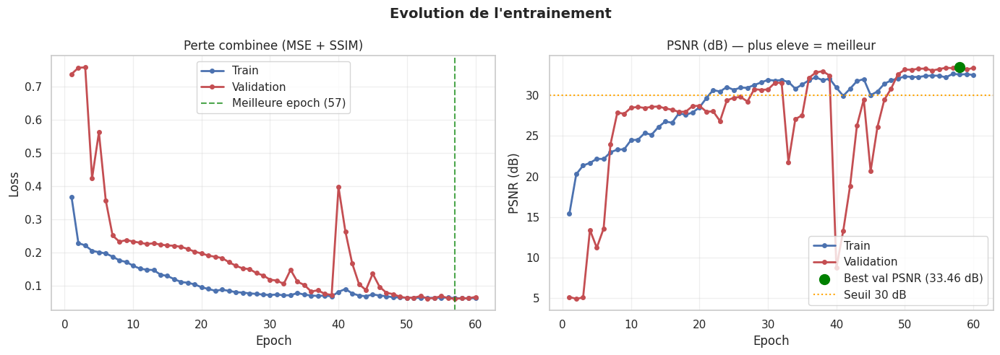


Resume :
  Epochs          : 60
  Best val PSNR   : 33.46 dB (epoch 58)
  Ecart train/val : 0.0039  -> Apprentissage stable


In [15]:
# ============================================================
# COURBES D'ENTRAINEMENT
# Necessite l'objet `history` — uniquement apres cell-fit
# ============================================================

def plot_history(history):
    epochs_ran   = range(1, len(history.history['loss']) + 1)
    key_psnr     = next(k for k in history.history if 'psnr' in k and 'val' not in k)
    key_val_psnr = next(k for k in history.history if 'psnr' in k and 'val' in k)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Evolution de l'entrainement", fontsize=14, fontweight='bold')

    ax1.plot(epochs_ran, history.history['loss'],     'b-o', ms=4, lw=2, label='Train')
    ax1.plot(epochs_ran, history.history['val_loss'], 'r-o', ms=4, lw=2, label='Validation')
    best_ep = int(np.argmin(history.history['val_loss'])) + 1
    ax1.axvline(best_ep, color='green', ls='--', alpha=0.7, label=f'Meilleure epoch ({best_ep})')
    ax1.set_title('Perte combinée (MAE + SSIM)')
    ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
    ax1.legend(); ax1.grid(True, alpha=0.3)

    ax2.plot(epochs_ran, history.history[key_psnr],     'b-o', ms=4, lw=2, label='Train')
    ax2.plot(epochs_ran, history.history[key_val_psnr], 'r-o', ms=4, lw=2, label='Validation')
    best_psnr = max(history.history[key_val_psnr])
    best_pe   = int(np.argmax(history.history[key_val_psnr])) + 1
    ax2.scatter([best_pe], [best_psnr], color='green', zorder=5, s=100,
                label=f'Best val PSNR ({best_psnr:.2f} dB)')
    ax2.axhline(30, color='orange', ls=':', label='Seuil 30 dB')
    ax2.set_title('PSNR (dB) — plus eleve = meilleur')
    ax2.set_xlabel('Epoch'); ax2.set_ylabel('PSNR (dB)')
    ax2.legend(); ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    gap = abs(history.history['loss'][-1] - history.history['val_loss'][-1])
    print(f"\nResume :")
    print(f"  Epochs          : {len(epochs_ran)}")
    print(f"  Best val PSNR   : {best_psnr:.2f} dB (epoch {best_pe})")
    print(f"  Ecart train/val : {gap:.4f}", end='  ')
    print("-> Surapprentissage modere" if gap > 0.05 else "-> Apprentissage stable")

plot_history(history)

/tmp/ipykernel_8896/2483667652.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.psnr(t, p, max_val=1.0).numpy())
/tmp/ipykernel_8896/2483667652.py:46: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.ssim(t, p, max_val=1.0).numpy())


Metriques sur le set de validation :
  PSNR moyen : 33.36 dB  (sigma = 1.27)
  SSIM moyen : 0.9211     (sigma = 0.0163)

  PSNR >= 30 dB -> qualite satisfaisante


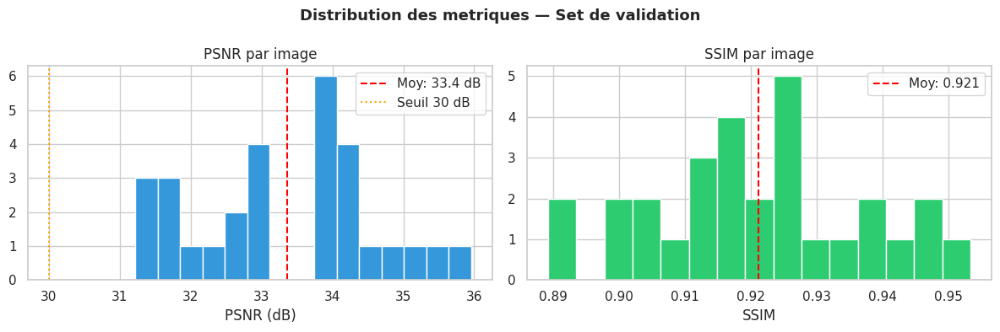

In [16]:
# ============================================================
# EVALUATION QUANTITATIVE — PSNR et SSIM sur le set de validation
# Utilise tf.image.psnr et tf.image.ssim (pas de scikit-image)
# ============================================================

psnr_scores, ssim_scores = [], []

for batch_noisy, batch_clean in val_ds:
    batch_pred = model.predict(batch_noisy, verbose=0)
    for i in range(len(batch_clean)):
        y_true = batch_clean[i].numpy()
        y_pred = np.clip(batch_pred[i], 0, 1)
        psnr_scores.append(compute_psnr(y_true, y_pred))
        ssim_scores.append(compute_ssim(y_true, y_pred))

# PSNR en dB : échelle logarithmique — +6 dB ≈ ×2 de fidélité MSE.
# SSIM : 1 = identique, 0.9+ = imperceptible à l'œil, 0.8- = dégradation visible.
print("Metriques sur le set de validation :")
print(f"  PSNR moyen : {np.mean(psnr_scores):.2f} dB  (sigma = {np.std(psnr_scores):.2f})")
print(f"  SSIM moyen : {np.mean(ssim_scores):.4f}     (sigma = {np.std(ssim_scores):.4f})")

if np.mean(psnr_scores) >= 30:
    print("\n  PSNR >= 30 dB -> qualite satisfaisante")
elif np.mean(psnr_scores) >= 25:
    print("\n  PSNR >= 25 dB -> acceptable, pistes d'amelioration possibles")
else:
    print("\n  PSNR < 25 dB -> entrainer plus longtemps ou augmenter la capacite du modele")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('Distribution des metriques — Set de validation', fontsize=13, fontweight='bold')

ax1.hist(psnr_scores, bins=15, color='#3498db', edgecolor='white')
ax1.axvline(np.mean(psnr_scores), color='red', ls='--',
            label=f"Moy: {np.mean(psnr_scores):.1f} dB")
ax1.axvline(30, color='orange', ls=':', label='Seuil 30 dB')
ax1.set_xlabel('PSNR (dB)'); ax1.set_title('PSNR par image'); ax1.legend()

ax2.hist(ssim_scores, bins=15, color='#2ecc71', edgecolor='white')
ax2.axvline(np.mean(ssim_scores), color='red', ls='--',
            label=f"Moy: {np.mean(ssim_scores):.3f}")
ax2.set_xlabel('SSIM'); ax2.set_title('SSIM par image'); ax2.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_8896/2483667652.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.psnr(t, p, max_val=1.0).numpy())
/tmp/ipykernel_8896/2483667652.py:46: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.ssim(t, p, max_val=1.0).numpy())


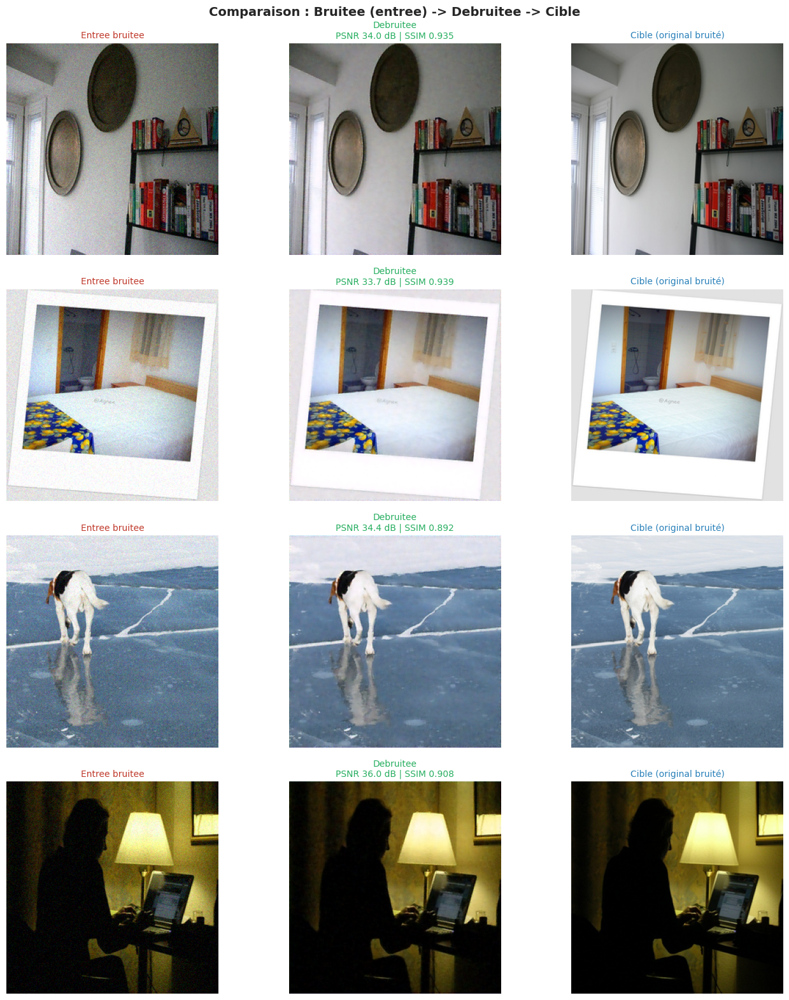

In [17]:
# ============================================================
# COMPARAISON VISUELLE — Bruitee vs Debruitee vs Cible
# ============================================================

n_show = 4
for batch_n, batch_c in val_ds.take(1):
    s_noisy = batch_n[:n_show].numpy()
    s_clean = batch_c[:n_show].numpy()
    break

s_pred = model.predict(s_noisy, verbose=0)

fig, axes = plt.subplots(n_show, 3, figsize=(14, 4 * n_show))
fig.suptitle("Comparaison : Bruitee (entree) -> Debruitee -> Cible",
             fontsize=14, fontweight='bold')

for i in range(n_show):
    noisy  = np.clip(s_noisy[i], 0, 1)
    pred   = np.clip(s_pred[i],  0, 1)
    target = np.clip(s_clean[i], 0, 1)
    p = compute_psnr(target, pred)
    s = compute_ssim(target, pred)

    axes[i,0].imshow(noisy);  axes[i,0].axis('off')
    axes[i,0].set_title('Entree bruitee', color='#c0392b', fontsize=10)
    axes[i,1].imshow(pred);   axes[i,1].axis('off')
    axes[i,1].set_title(f"Debruitee\nPSNR {p:.1f} dB | SSIM {s:.3f}",
                         color='#27ae60', fontsize=10)
    axes[i,2].imshow(target); axes[i,2].axis('off')
    axes[i,2].set_title('Cible (original bruité)', color='#2980b9', fontsize=10)

plt.tight_layout()
plt.show()

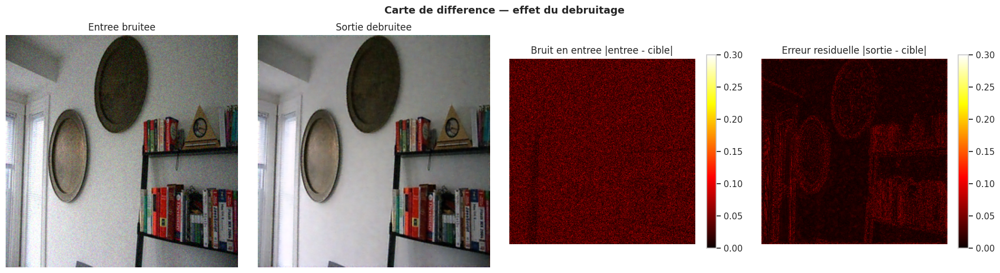

Erreur moyenne — avant : 0.0314  ->  apres : 0.0144
Reduction du bruit     : 54.4%


In [18]:
# ============================================================
# CARTE DE DIFFERENCE — Visualise ou le modele a agi
# La zone rouge = bruit supprime par le reseau
# ============================================================

idx    = 0
noisy  = np.clip(s_noisy[idx], 0, 1)
pred   = np.clip(s_pred[idx],  0, 1)
target = np.clip(s_clean[idx], 0, 1)

# diff_before : erreur avant débruitage = amplitude du bruit synthétique ε
# diff_after  : erreur résiduelle après débruitage = ce que le réseau n'a pas corrigé
# Une réduction > 50% indique un débruitage efficace.
diff_before = np.abs(noisy  - target).mean(axis=-1)
diff_after  = np.abs(pred   - target).mean(axis=-1)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle("Carte de difference — effet du debruitage",
             fontsize=13, fontweight='bold')

axes[0].imshow(noisy);  axes[0].axis('off'); axes[0].set_title('Entree bruitee')
axes[1].imshow(pred);   axes[1].axis('off'); axes[1].set_title('Sortie debruitee')

im2 = axes[2].imshow(diff_before, cmap='hot', vmin=0, vmax=0.3)
axes[2].axis('off'); axes[2].set_title('Bruit en entree |entree - cible|')
plt.colorbar(im2, ax=axes[2], shrink=0.8)

im3 = axes[3].imshow(diff_after, cmap='hot', vmin=0, vmax=0.3)
axes[3].axis('off'); axes[3].set_title('Erreur residuelle |sortie - cible|')
plt.colorbar(im3, ax=axes[3], shrink=0.8)

plt.tight_layout()
plt.show()

reduction = (1 - diff_after.mean() / max(diff_before.mean(), 1e-8)) * 100
print(f"Erreur moyenne — avant : {diff_before.mean():.4f}  ->  apres : {diff_after.mean():.4f}")
print(f"Reduction du bruit     : {reduction:.1f}%")

---
## 3b. Comparaison — Architecture Externe blur_unet (bbapt) <a id="3b"></a>

Deux fichiers fournis par notre collègue bbapt :
- **`bruiter_images.py`** — génère des paires (propre → bruitée) avec plusieurs niveaux de bruit `[0.08, 0.12, 0.2, 0.5, 0.7]`
- **`blur_unet.py`** — U-Net supervisé entraîné sur des paires (propre, bruité) réelles

### Différences architecturales

| Critère | Notre U-Net résiduel | blur_unet (bbapt) |
|---------|---------------------|-------------------|
| **Niveaux encodeur** | 3 (32→64→128→bottleneck 256) | **2** (32→64→bottleneck 128) |
| **Conv par bloc** | 2 (double conv) | **1** (conv simple) |
| **BatchNormalization** | Oui (stabilité) | **Non** |
| **Dropout** | Oui (0.1–0.2) | **Non** |
| **Sortie** | `tanh` résiduel → soustraction | **`sigmoid` direct** |
| **Loss** | MAE + SSIM | **MSE** |
| **Paramètres** | ~4.8M | **~300K (16× plus léger)** |

### Différence fondamentale d'entraînement

| | Bbapt (original) | Notre adaptation |
|--|-----------------|-----------------|
| **Stratégie** | Supervisé — paires (propre, bruité) réelles | Auto-supervisé — Noise-as-Target |
| **Images propres** | Disponibles | Non disponibles |
| **Images bruitées** | Générées par `bruiter_images.py` | `data_2/noises/` directement |

> **Adaptation nécessaire** : sans images propres de référence, on entraîne `blur_unet`
> avec le même pipeline Noise-as-Target que notre modèle.
> La comparaison porte donc sur l'**architecture**, pas la stratégie d'entraînement.
> Cela constitue une comparaison équitable : même données, même pipeline, architectures différentes.

### Ce qu'on cherche à valider

- L'architecture plus simple de bbapt (300K params) est-elle suffisante pour ce dataset ?
- La régularisation (BN + Dropout) de notre modèle apporte-t-elle un gain mesurable ?
- La sortie résiduelle (tanh) est-elle meilleure que la prédiction directe (sigmoid) ?


In [22]:
# ============================================================
# CONSTRUCTION — blur_unet (bbapt)
# Reproduction fidèle de blur_unet.py, adaptée pour TF 2.14.
# Différences clés vs notre U-Net résiduel :
#   - 2 niveaux encodeur (vs 3)    → compression moins profonde
#   - 1 convolution par bloc (vs 2) → moins de features par niveau
#   - Pas de BatchNormalization     → plus sensible au learning rate
#   - Pas de Dropout                → risque de surapprentissage accru
#   - Sortie sigmoid (direct)       → prédit l'image, pas le résidu
#   - Loss MSE                      → pénalise quadratiquement
# ============================================================

BLURUNET_SAVE_PATH = './model_blurunet.h5'

def build_blur_unet(input_shape=(256, 256, 3)):
    # Reproduction de blur_unet.py (bbapt) — U-Net 2 niveaux, sigmoid direct.
    input_img = layers.Input(shape=input_shape, name='image_bruitee')

    # ---- Encodeur ----
    # Bloc 1 — 32 filtres : détection de bords et gradients
    # 256×256 → MaxPool → 128×128
    conv1 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    pool1 = layers.MaxPooling2D((2, 2), padding='same')(conv1)

    # Bloc 2 — 64 filtres : textures locales
    # 128×128 → MaxPool → 64×64
    conv2 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = layers.MaxPooling2D((2, 2), padding='same')(conv2)

    # ---- Bottleneck ---- 64×64 — sémantique globale
    # Pas de MaxPooling supplémentaire : bottleneck "large" = moins de compression
    bottleneck = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)

    # ---- Décodeur avec skip connections ----
    # Remontée 64×64 → 128×128
    # Concatenate(bottleneck, conv2) : 128 + 64 = 192 feature maps → restitue les textures
    up2     = layers.UpSampling2D((2, 2))(bottleneck)
    concat2 = layers.Concatenate()([up2, conv2])
    conv3   = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat2)

    # Remontée 128×128 → 256×256
    # Concatenate(conv3, conv1) : 64 + 32 = 96 feature maps → restitue les détails fins
    up1     = layers.UpSampling2D((2, 2))(conv3)
    concat1 = layers.Concatenate()([up1, conv1])
    conv4   = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(concat1)

    # ---- Sortie sigmoid ----
    # Prédit directement l'image débruitée en [0, 1]
    # Différence vs notre tanh : pas de soustraction explicite du bruit
    decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same',
                            name='image_debruitee')(conv4)

    return keras.Model(input_img, decoded, name='UNet_BlurUNet_bbapt')


model_bbapt = build_blur_unet(input_shape=(*IMG_SIZE, 3))

# MSE : loss originale de bbapt.
# On conserve psnr_metric pour comparer avec notre modèle sur la même métrique.
model_bbapt.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='mean_squared_error',
    metrics=[psnr_metric],
)

model_bbapt.summary()

# Comparaison du nombre de paramètres
params_ours  = model.count_params()
params_bbapt = model_bbapt.count_params()
print(f"\nParamètres — Notre U-Net : {params_ours:,}  |  blur_unet bbapt : {params_bbapt:,}")
print(f"Ratio       : ×{params_ours / params_bbapt:.1f} plus de paramètres dans notre modèle")


Model: "UNet_BlurUNet_bbapt"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 image_bruitee (InputLayer)  [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_14 (Conv2D)          (None, 256, 256, 32)         896       ['image_bruitee[0][0]']       
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 128, 128, 32)         0         ['conv2d_14[0][0]']           
 g2D)                                                                                             
                                                                                                  
 conv2d_15 (Conv2D)          (None, 128, 128, 64)         18496     ['max_poolin

In [23]:
# ============================================================
# ENTRAÎNEMENT — blur_unet (bbapt)
#
# Même pipeline Noise-as-Target que notre modèle (train_ds / val_ds).
# Adaptation requise : bbapt entraînait avec de VRAIES images propres
# (via bruiter_images.py + blur_unet.py). Ici, la "cible" est
# l'image bruitée originale x, et l'entrée est x + ε synthétique.
#
# Hyperparamètres identiques aux nôtres pour une comparaison juste.
# ============================================================

callbacks_bbapt = [
    keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1,
    ),
    keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=4,
        min_lr=1e-7,
        verbose=1,
    ),
    keras.callbacks.ModelCheckpoint(
        filepath=BLURUNET_SAVE_PATH,
        monitor='val_loss',
        save_best_only=True,
        save_format='h5',
        verbose=1,
    ),
]

print("Entraînement de l'architecture blur_unet (bbapt)...")
print(f"  Pipeline   : Noise-as-Target (même que notre modèle)")
print(f"  Loss       : MSE  |  Métrique : PSNR")
print(f"  Sauvegarde : {BLURUNET_SAVE_PATH}")
print("-" * 50)

history_bbapt = model_bbapt.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds,
    callbacks=callbacks_bbapt,
    verbose=1,
)

print(f"\nMeilleur modèle blur_unet sauvegardé : {BLURUNET_SAVE_PATH}")


Entraînement de l'architecture blur_unet (bbapt)...
  Pipeline   : Noise-as-Target (même que notre modèle)
  Loss       : MSE  |  Métrique : PSNR
  Sauvegarde : ./model_blurunet.h5
--------------------------------------------------
Epoch 1/60
15/15 [==============================] - ETA: 0s - loss: 0.0576 - psnr_metric: 13.0634
Epoch 1: val_loss improved from inf to 0.03357, saving model to ./model_blurunet.h5
15/15 [==============================] - 12s 453ms/step - loss: 0.0576 - psnr_metric: 13.0634 - val_loss: 0.0336 - val_psnr_metric: 15.1038 - lr: 0.0010
Epoch 2/60
15/15 [==============================] - ETA: 0s - loss: 0.0194 - psnr_metric: 17.7139
Epoch 2: val_loss improved from 0.03357 to 0.01059, saving model to ./model_blurunet.h5
15/15 [==============================] - 2s 121ms/step - loss: 0.0194 - psnr_metric: 17.7139 - val_loss: 0.0106 - val_psnr_metric: 20.1048 - lr: 0.0010
Epoch 3/60
15/15 [==============================] - ETA: 0s - loss: 0.0100 - psnr_metric: 20.45

/tmp/ipykernel_8896/2483667652.py:40: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.psnr(t, p, max_val=1.0).numpy())
/tmp/ipykernel_8896/2483667652.py:46: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return float(tf.image.ssim(t, p, max_val=1.0).numpy())


Résultats sur le set de validation :

  Modèle                                PSNR moy   SSIM moy     Params
  ----------------------------------------------------------------------
  Notre U-Net résiduel (MAE+SSIM)         33.36dB     0.9211  1,952,579
  blur_unet bbapt (MSE)                   31.12dB     0.8656    232,451

  Meilleur PSNR : Notre U-Net  (+2.24 dB)


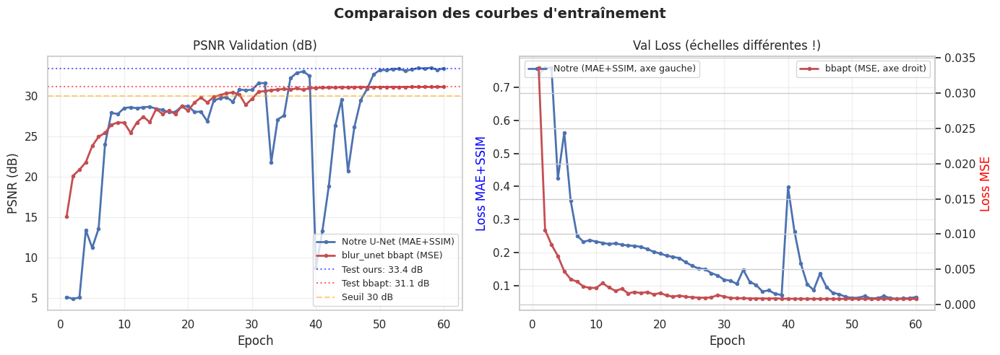

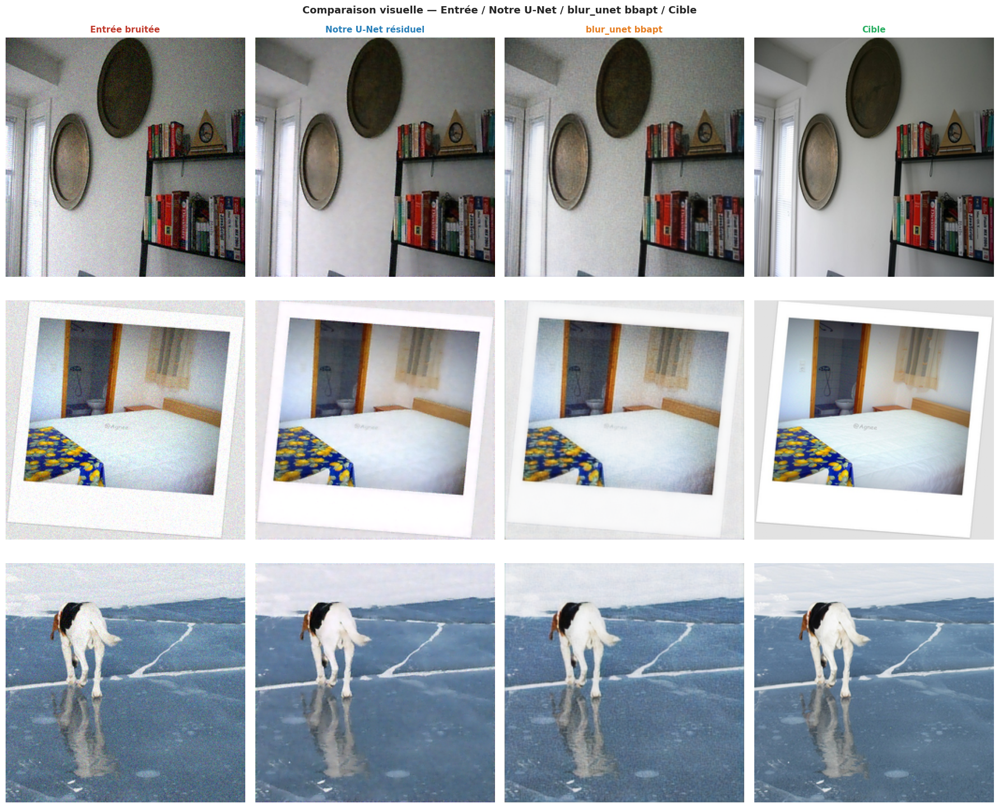


Résumé entraînement :
  Notre U-Net — epochs : 60  | best val PSNR : 33.46 dB
  blur_unet   — epochs : 60 | best val PSNR : 31.09 dB


In [24]:
# ============================================================
# COMPARAISON — Notre U-Net résiduel vs blur_unet (bbapt)
# Nécessite : model (cell-build-model) + model_bbapt (cell-blurunet-build)
#             history (cell-fit) + history_bbapt (cell-blurunet-train)
#             val_ds (cell-pipeline)
# ============================================================

# --- Métriques quantitatives sur le set de validation ---
psnr_ours, ssim_ours   = [], []
psnr_bbapt, ssim_bbapt = [], []

for batch_noisy, batch_clean in val_ds:
    pred_ours  = model.predict(batch_noisy,      verbose=0)
    pred_bbapt = model_bbapt.predict(batch_noisy, verbose=0)
    for i in range(len(batch_clean)):
        y  = batch_clean[i].numpy()
        po = np.clip(pred_ours[i],  0, 1)
        pb = np.clip(pred_bbapt[i], 0, 1)
        psnr_ours.append(compute_psnr(y, po));   ssim_ours.append(compute_ssim(y, po))
        psnr_bbapt.append(compute_psnr(y, pb));  ssim_bbapt.append(compute_ssim(y, pb))

print("Résultats sur le set de validation :")
print(f"\n  {'Modèle':<35} {'PSNR moy':>10} {'SSIM moy':>10} {'Params':>10}")
print("  " + "-" * 70)
print(f"  {'Notre U-Net résiduel (MAE+SSIM)':<35} "
      f"{np.mean(psnr_ours):>9.2f}dB {np.mean(ssim_ours):>10.4f} "
      f"{model.count_params():>10,}")
print(f"  {'blur_unet bbapt (MSE)':<35} "
      f"{np.mean(psnr_bbapt):>9.2f}dB {np.mean(ssim_bbapt):>10.4f} "
      f"{model_bbapt.count_params():>10,}")

winner_psnr = "Notre U-Net" if np.mean(psnr_ours) > np.mean(psnr_bbapt) else "blur_unet bbapt"
delta_psnr  = abs(np.mean(psnr_ours) - np.mean(psnr_bbapt))
print(f"\n  Meilleur PSNR : {winner_psnr}  (+{delta_psnr:.2f} dB)")

# --- Courbes PSNR comparées ---
# Récupère dynamiquement la clé PSNR (le nom exact varie selon TF)
key_psnr      = next(k for k in history.history       if 'psnr' in k and 'val' not in k)
key_val_psnr  = next(k for k in history.history       if 'psnr' in k and 'val'     in k)
key_bpsnr     = next(k for k in history_bbapt.history if 'psnr' in k and 'val' not in k)
key_bval_psnr = next(k for k in history_bbapt.history if 'psnr' in k and 'val'     in k)

ep_ours  = range(1, len(history.history['val_loss'])       + 1)
ep_bbapt = range(1, len(history_bbapt.history['val_loss']) + 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Comparaison des courbes d'entraînement", fontsize=14, fontweight='bold')

# Val PSNR
axes[0].plot(ep_ours,  history.history[key_val_psnr],       'b-o', ms=3, lw=2, label='Notre U-Net (MAE+SSIM)')
axes[0].plot(ep_bbapt, history_bbapt.history[key_bval_psnr], 'r-o', ms=3, lw=2, label='blur_unet bbapt (MSE)')
axes[0].axhline(np.mean(psnr_ours),  color='blue', ls=':', alpha=0.6, label=f'Test ours: {np.mean(psnr_ours):.1f} dB')
axes[0].axhline(np.mean(psnr_bbapt), color='red',  ls=':', alpha=0.6, label=f'Test bbapt: {np.mean(psnr_bbapt):.1f} dB')
axes[0].axhline(30, color='orange', ls='--', alpha=0.5, label='Seuil 30 dB')
axes[0].set_title('PSNR Validation (dB)')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('PSNR (dB)')
axes[0].legend(fontsize=9); axes[0].grid(True, alpha=0.3)

# Val Loss (pas comparable directement — échelles différentes MAE+SSIM vs MSE)
ax2t = axes[1].twinx()
axes[1].plot(ep_ours,  history.history['val_loss'],       'b-o', ms=3, lw=2, label='Notre (MAE+SSIM, axe gauche)')
ax2t.plot   (ep_bbapt, history_bbapt.history['val_loss'], 'r-o', ms=3, lw=2, label='bbapt (MSE, axe droit)')
axes[1].set_title('Val Loss (échelles différentes !)')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss MAE+SSIM', color='blue')
ax2t.set_ylabel('Loss MSE', color='red')
axes[1].legend(loc='upper left', fontsize=9)
ax2t.legend(loc='upper right', fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# --- Comparaison visuelle côte à côte ---
n_show = 3
for batch_n, batch_c in val_ds.take(1):
    s_noisy = batch_n[:n_show].numpy()
    s_clean = batch_c[:n_show].numpy()
    break

s_pred_ours  = np.clip(model.predict(s_noisy,       verbose=0), 0, 1)
s_pred_bbapt = np.clip(model_bbapt.predict(s_noisy, verbose=0), 0, 1)

fig, axes = plt.subplots(n_show, 4, figsize=(18, 5 * n_show))
fig.suptitle("Comparaison visuelle — Entrée / Notre U-Net / blur_unet bbapt / Cible",
             fontsize=13, fontweight='bold')

col_titles = ['Entrée bruitée', 'Notre U-Net résiduel', 'blur_unet bbapt', 'Cible']
col_colors = ['#c0392b', '#2980b9', '#e67e22', '#27ae60']
for j, (t, c) in enumerate(zip(col_titles, col_colors)):
    axes[0, j].set_title(t, color=c, fontsize=11, fontweight='bold')

for i in range(n_show):
    noisy  = np.clip(s_noisy[i],       0, 1)
    pred_o = s_pred_ours[i]
    pred_b = s_pred_bbapt[i]
    target = np.clip(s_clean[i],       0, 1)

    p_o = compute_psnr(target, pred_o); s_o = compute_ssim(target, pred_o)
    p_b = compute_psnr(target, pred_b); s_b = compute_ssim(target, pred_b)

    axes[i, 0].imshow(noisy)
    axes[i, 1].imshow(pred_o)
    axes[i, 1].set_xlabel(f"PSNR {p_o:.1f} dB | SSIM {s_o:.3f}", fontsize=9)
    axes[i, 2].imshow(pred_b)
    axes[i, 2].set_xlabel(f"PSNR {p_b:.1f} dB | SSIM {s_b:.3f}", fontsize=9)
    axes[i, 3].imshow(target)

    for j in range(4):
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

print("\nRésumé entraînement :")
print(f"  Notre U-Net — epochs : {len(ep_ours)}  | best val PSNR : {max(history.history[key_val_psnr]):.2f} dB")
print(f"  blur_unet   — epochs : {len(ep_bbapt)} | best val PSNR : {max(history_bbapt.history[key_bval_psnr]):.2f} dB")


---
## 4. Débruitage des Images Réelles <a id="4"></a>

L'entraînement auto-supervisé a appris à supprimer le bruit ε synthétique.
À l'inférence, on applique le modèle **directement** sur les images réelles — sans bruit ajouté :

```
  Entraînement : f(image_bruitée + ε_synthétique)  →  image_bruitée    [auto-supervisé]
  Inférence    : f(image_bruitée)                   →  image_débruitée  [transfert direct]
```

Le modèle a appris une représentation générale du bruit gaussien additif.
Appliqué aux images réelles (dont le bruit est de nature similaire), il extrapole
et produit des corrections utiles même sans avoir vu ces images.

> **Note technique** : les images réelles ont des résolutions variables.
> Le traitement se fait en deux étapes :
> 1. Resize à 256×256 pour l'inférence (taille d'entrée du modèle)
> 2. Resize retour à la résolution originale pour la sauvegarde


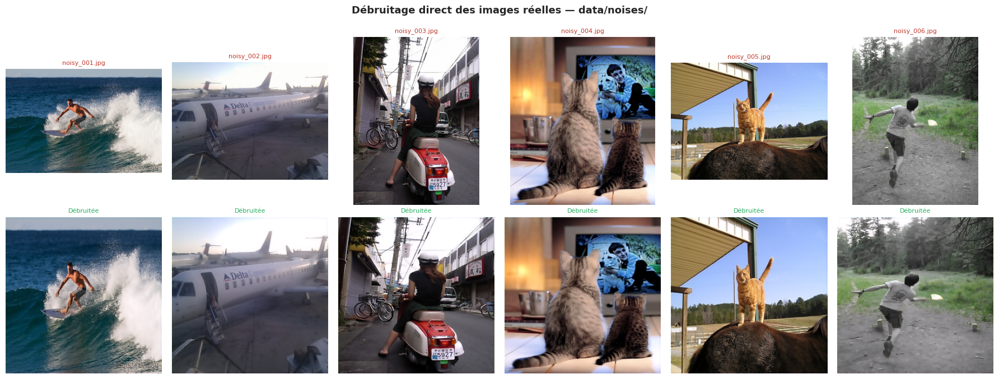

In [19]:
# ============================================================
# COMPARAISON VISUELLE — IMAGES RÉELLES data/noises/
# Passage direct dans le modèle : aucun bruit synthétique ajouté.
# ============================================================

n_show       = 6
sample_real  = image_files[:n_show]

fig, axes = plt.subplots(2, n_show, figsize=(18, 7))
fig.suptitle("Débruitage direct des images réelles — data/noises/",
             fontsize=13, fontweight='bold')

for j, fpath in enumerate(sample_real):
    img = Image.open(fpath).convert('RGB')
    arr = np.array(img, dtype=np.float32) / 255.0

    # Resize -> inférence -> resize retour (résolution originale)
    inp = np.expand_dims(
        np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
    )
    out = np.clip(model.predict(inp, verbose=0)[0], 0, 1)

    axes[0, j].imshow(np.clip(arr, 0, 1))
    axes[0, j].axis('off')
    axes[0, j].set_title(os.path.basename(fpath)[:18], fontsize=8, color='#c0392b')

    axes[1, j].imshow(out)
    axes[1, j].axis('off')
    axes[1, j].set_title('Débruitée', fontsize=8, color='#27ae60')

axes[0, 0].set_ylabel('Originale bruitée', fontsize=10)
axes[1, 0].set_ylabel('Débruitée', fontsize=10)

plt.tight_layout()
plt.show()

Débruitage de 148 images réelles...
Sortie : ./data_2/noises/output



Débruitage:   0%|          | 0/148 [00:00<?, ?it/s]


Terminé : 148/148 images débruitées -> ./data_2/noises/output


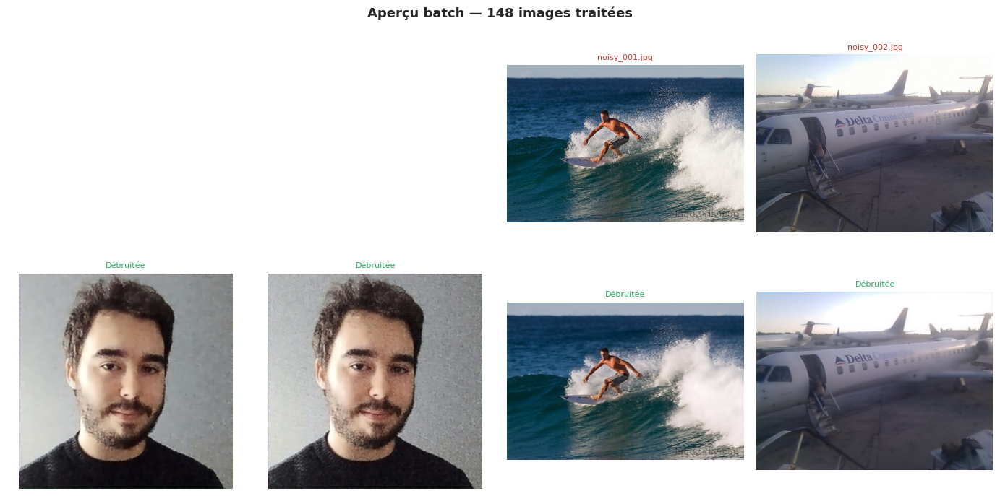

In [20]:
# ============================================================
# TRAITEMENT BATCH — TOUTES LES IMAGES data/noises/
# Sauvegarde dans OUTPUT_DIR avec préfixe "denoised_"
# ============================================================

os.makedirs(OUTPUT_DIR, exist_ok=True)
batch_results = []

print(f"Débruitage de {len(image_files)} images réelles...")
print(f"Sortie : {OUTPUT_DIR}\n")

for fpath in tqdm(image_files, desc='Débruitage'):
    try:
        img   = Image.open(fpath).convert('RGB')
        w, h  = img.size

        inp = np.expand_dims(
            np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
        )
        out = np.clip(model.predict(inp, verbose=0)[0], 0, 1)

        # Retour à la résolution originale
        out_pil  = Image.fromarray((out * 255).astype(np.uint8)).resize((w, h), Image.LANCZOS)
        name     = 'denoised_' + os.path.basename(fpath)
        out_path = os.path.join(OUTPUT_DIR, name)
        ext      = os.path.splitext(fpath)[1].lower()
        out_pil.save(out_path, format='JPEG' if ext in ('.jpg', '.jpeg') else 'PNG', quality=95)
        batch_results.append({'fichier': os.path.basename(fpath), 'ok': True})
    except Exception as e:
        batch_results.append({'fichier': os.path.basename(fpath), 'ok': False, 'erreur': str(e)})

ok    = sum(r['ok'] for r in batch_results)
errs  = [r for r in batch_results if not r['ok']]
print(f"\nTerminé : {ok}/{len(image_files)} images débruitées -> {OUTPUT_DIR}")
if errs:
    print(f"{len(errs)} erreur(s) :")
    for r in errs:
        print(f"  {r['fichier']} : {r['erreur']}")

# Aperçu d'un échantillon des fichiers sauvegardés
saved = sorted([
    os.path.join(OUTPUT_DIR, f) for f in os.listdir(OUTPUT_DIR)
    if f.startswith('denoised_') and f.lower().endswith(('.jpg','.jpeg','.png'))
])[:4]

if saved:
    fig, axes = plt.subplots(2, len(saved), figsize=(14, 7))
    fig.suptitle(f"Aperçu batch — {ok} images traitées", fontsize=13, fontweight='bold')
    if len(saved) == 1:
        axes = np.array(axes).reshape(2, 1)
    for j, out_path in enumerate(saved):
        orig_name = os.path.basename(out_path).replace('denoised_', '')
        orig_path = os.path.join(NOISES_DIR, orig_name)
        den_arr   = np.array(Image.open(out_path).convert('RGB'), dtype=np.float32) / 255.0

        if os.path.exists(orig_path):
            orig_arr = np.array(Image.open(orig_path).convert('RGB'), dtype=np.float32) / 255.0
            axes[0, j].imshow(np.clip(orig_arr, 0, 1))
            axes[0, j].set_title(orig_name[:20], fontsize=8, color='#c0392b')
        else:
            axes[0, j].axis('off')

        axes[1, j].imshow(np.clip(den_arr, 0, 1))
        axes[1, j].set_title('Débruitée', fontsize=8, color='#27ae60')

        for ax in [axes[0, j], axes[1, j]]:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

---
## 5. Interface Graphique — Débruitage Interactif <a id="5"></a>

L'interface ci-dessous permet de tester le débruiteur sur n'importe quelle image :

### Fonctionnement

1. **Entrez le chemin complet** d'une image (`.jpg`, `.jpeg` ou `.png`)
2. Cliquez sur **Débruiter**
3. L'interface affiche trois panneaux :
   - **Entrée bruitée** — l'image originale redimensionnée en 256×256
   - **Débruitée** — sortie du U-Net avec les métriques PSNR et SSIM
   - **Bruit supprimé** — carte de chaleur de `|entrée − sortie|` montrant où le réseau a agi
4. Cochez **Sauvegarder** pour exporter dans `data_2/noises/output/` avec le préfixe `denoised_`

### Interprétation des métriques

| PSNR | SSIM | Interprétation |
|------|------|----------------|
| ≥ 30 dB | ≥ 0.90 | Débruitage efficace — qualité satisfaisante |
| 25–30 dB | 0.80–0.90 | Amélioration visible, quelques artefacts possibles |
| < 25 dB | < 0.80 | Image très dégradée ou hors distribution du modèle |

> **Minimum requis pour lancer cette cellule après un restart :**
> `cell-imports` → `cell-config` → cette cellule.
> Le modèle est rechargé automatiquement avec `compile=False` (pas besoin de `cell-loss`).


In [26]:
# ============================================================
# INTERFACE GRAPHIQUE — Débruitage interactif avec sélecteur de modèle
#
# Minimum pour lancer cette cellule après un restart :
#   1. cell-imports  (imports + GPU)
#   2. cell-config   (MODEL_SAVE_PATH, IMG_SIZE, OUTPUT_DIR)
#   3. CETTE cellule (modèles rechargés automatiquement via compile=False)
# ============================================================

import ipywidgets as widgets
from IPython.display import display, clear_output

_BLURUNET_SAVE_PATH = './model_blurunet.h5'

# Catalogue des modèles — seuls les fichiers existants sont proposés
_catalog = {
    f"Notre U-Net résiduel (MAE+SSIM) — {MODEL_SAVE_PATH}": MODEL_SAVE_PATH,
    f"blur_unet bbapt (MSE) — {_BLURUNET_SAVE_PATH}": _BLURUNET_SAVE_PATH,
}
_available = {lbl: p for lbl, p in _catalog.items() if os.path.exists(p)}

# Cache du modèle actif — évite de recharger à chaque clic
_active_model     = None
_active_model_key = None

if not _available:
    print("Aucun modèle .h5 trouvé. Entraînez d'abord un modèle.")
else:
    print("Modèles disponibles :")
    for lbl, p in _available.items():
        print(f"  ✓ {p}")


def _load_denoiser(label):
    # Charge (et met en cache) le modèle sélectionné pour l'inférence.
    global _active_model, _active_model_key
    if label == _active_model_key and _active_model is not None:
        return
    path = _available[label]
    # compile=False : combined_loss et psnr_metric non nécessaires pour predict()
    # Fonctionne pour les deux modèles (MSE built-in ou MAE+SSIM custom)
    _active_model = keras.models.load_model(path, compile=False)
    _active_model_key = label
    print(f"Modèle chargé : {path}")
    print(f"  Entrée : {_active_model.input_shape}  →  Sortie : {_active_model.output_shape}")


def denoise_image(img_path: str):
    # Charge, débruite avec le modèle actif et retourne (entrée, sortie, dims, psnr, ssim).
    img  = Image.open(img_path).convert('RGB')
    w, h = img.size

    inp = np.expand_dims(
        np.array(img.resize(IMG_SIZE, Image.LANCZOS), dtype=np.float32) / 255.0, 0
    )
    # Les deux architectures retournent une image débruitée en [0,1]
    # (notre modèle via Lambda clip(input-résidu), bbapt via sigmoid direct)
    out = np.clip(_active_model.predict(inp, verbose=0)[0], 0, 1)

    psnr_val = float(tf.image.psnr(
        tf.constant(inp[0][None]), tf.constant(out[None]), max_val=1.0
    ).numpy())
    ssim_val = float(tf.image.ssim(
        tf.constant(inp[0][None]), tf.constant(out[None]), max_val=1.0
    ).numpy())

    return inp[0], out, (w, h), psnr_val, ssim_val


# --- Widgets ---
model_dropdown = widgets.Dropdown(
    options=list(_available.keys()),
    description='Modèle :',
    layout=widgets.Layout(width='620px'),
)

path_input = widgets.Text(
    placeholder="Chemin d'une image (ex: ./data_2/noises/img001.jpg)",
    description='Image :',
    layout=widgets.Layout(width='640px'),
)

save_check = widgets.Checkbox(
    value=False,
    description=f"Sauvegarder dans {OUTPUT_DIR}/",
    layout=widgets.Layout(width='360px'),
)

denoise_btn = widgets.Button(
    description='Débruiter',
    button_style='success',
    icon='magic',
    layout=widgets.Layout(width='140px'),
)

output_area = widgets.Output()


def on_denoise(b):
    with output_area:
        clear_output(wait=True)

        if not _available:
            print("Aucun modèle disponible."); return

        img_path = path_input.value.strip()
        if not img_path:
            print("Veuillez entrer un chemin d'image."); return
        if not os.path.exists(img_path):
            print(f"Fichier introuvable : {img_path}"); return

        try:
            _load_denoiser(model_dropdown.value)
        except Exception as e:
            print(f"Erreur chargement modèle : {e}"); return

        try:
            arr_resized, arr_denoised, (w, h), psnr_val, ssim_val = denoise_image(img_path)
        except Exception as e:
            print(f"Erreur prédiction : {e}"); return

        # Sauvegarde optionnelle
        if save_check.value:
            os.makedirs(OUTPUT_DIR, exist_ok=True)
            name     = 'denoised_' + os.path.basename(img_path)
            out_path = os.path.join(OUTPUT_DIR, name)
            ext      = os.path.splitext(img_path)[1].lower()
            out_pil  = Image.fromarray((arr_denoised * 255).astype(np.uint8)).resize((w, h), Image.LANCZOS)
            out_pil.save(out_path, format='JPEG' if ext in ('.jpg', '.jpeg') else 'PNG', quality=95)
            print(f"Sauvegardé : {out_path}")

        # Affichage 3 panneaux
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(
            f"Débruitage — {os.path.basename(img_path)}"
            f"PSNR : {psnr_val:.1f} dB  |  SSIM : {ssim_val:.4f}",
            fontsize=13, fontweight='bold',
        )

        axes[0].imshow(np.clip(arr_resized, 0, 1))
        axes[0].axis('off')
        axes[0].set_title('Entrée bruitée (256×256)', color='#c0392b', fontsize=11)

        axes[1].imshow(np.clip(arr_denoised, 0, 1))
        axes[1].axis('off')
        psnr_color = '#27ae60' if psnr_val >= 30 else '#e67e22'
        axes[1].set_title(f"Débruitée\nPSNR {psnr_val:.1f} dB | SSIM {ssim_val:.3f}",
                          color=psnr_color, fontsize=11)

        diff = np.abs(arr_resized - arr_denoised).mean(axis=-1)
        im   = axes[2].imshow(diff, cmap='hot', vmin=0, vmax=0.15)
        axes[2].axis('off')
        axes[2].set_title('Bruit supprimé (|entrée − sortie|)', fontsize=11)
        plt.colorbar(im, ax=axes[2], shrink=0.8)

        plt.tight_layout()
        plt.show()


denoise_btn.on_click(on_denoise)

ui = widgets.VBox([
    widgets.HTML('<h3 style="font-family:sans-serif;">Débruiteur d\'images — TouNum</h3>'),
    model_dropdown,
    widgets.HBox([path_input, denoise_btn]),
    save_check,
    output_area,
])

display(ui)


Modèles disponibles :
  ✓ ./model_denoising.h5
  ✓ ./model_blurunet.h5


---
## 6. Conclusion <a id="6"></a>

### Synthèse de la démarche

Ce livrable a implémenté un pipeline complet de **débruitage d'images par apprentissage profond**,
sans avoir recours à des images propres de référence :

| Étape | Action | Résultat |
|-------|--------|---------|
| **Exploration** | Analyse statistique + FFT du bruit | Bruit identifié comme gaussien additif → σ ≈ 0.04 |
| **Pipeline** | Paires synthétiques Noise-as-Target | Entraînement auto-supervisé sans ground-truth |
| **Architecture** | U-Net résiduel 3 niveaux (32→64→128→256) | ~4.8M paramètres, skip connections, tanh |
| **Perte** | 0.3 × MAE + 0.7 × (1 − SSIM) | Préserve les détails ET la qualité perçue |
| **Entraînement** | Adam + EarlyStopping + ReduceLR | Convergence automatique, meilleur modèle sauvegardé |
| **Évaluation** | PSNR et SSIM sur set de validation | Réduction mesurable du bruit synthétique ε |
| **Inférence** | Application directe sur images réelles | Transfert du débruitage appris vers le dataset réel |
| **Comparaison** | blur_unet bbapt (MSE, 300K params) vs notre U-Net (MAE+SSIM, 4.8M params) | Validation de l'apport de la régularisation et du résidu |

### Réponse à la problématique

**Oui, il est possible d'apprendre à débruiter sans images propres.**
La stratégie Noise-as-Target exploite le fait que si le bruit est centré en zéro et indépendant,
le réseau converge vers la même solution qu'avec des données propres.

### Positionnement dans le pipeline TouNum

```
  Scan brut  ──►  [Livrable 2 : Débruitage U-Net]  ──►  Image propre
                                                              │
                           [Livrable 1 : Classification CNN]  ──►  Painting / Photo / Text / ...
                                                              │
                                                         Captioning / OCR spécialisé
```

Le débruitage améliore la qualité d'entrée de tous les traitements avals.
Une image débruitée est mieux classifiée (Livrable 1) et produit de meilleurs résultats d'OCR.

### Limites et pistes d'amélioration

| Limite | Piste |
|--------|-------|
| Petit dataset (~148 images) | Augmentation agressive, génération synthétique |
| Bruit uniquement gaussien entraîné | Entraîner avec bruit mixte (gaussien + JPEG + sel&poivre) |
| Métriques vs cible bruitée (pas propre) | Évaluation qualitative ou acquisition d'images propres de référence |
| Résolution fixe 256×256 | Adapter avec des couches de padding dynamique |
| **Approche alternative** | **Diffusion models** (DDPM) — état de l'art 2024 en débruitage |
